In [1]:
from sklearn.model_selection import train_test_split
from pathlib import Path
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.utils import to_categorical, Sequence
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Conv2D, MaxPooling2D, concatenate, Conv2DTranspose, BatchNormalization, Activation, Dropout
from tensorflow import keras
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import json
import sys
from models.UNet.UNet import UNet
sys.path.insert(0, '../shared/')
from data_generator import DataGenerator
from predict import Predict

In [2]:
json_file = open('../config/config.json')
data = json.load(json_file)

# Splits training and testing data then gets corresponding files based on similar file names
dataset_path = data['DATASET_PATH'] + 'Night/'

validation_rgb = list(Path(dataset_path + 'RGB/Night_Validation').glob('*.png'))
validation_annotated = list(Path(dataset_path + 'Annotated/Validation').glob('*_gt_labelColor.png'))

# Splits training and testing data then gets corresponding files based on similar file names
training_rgb, test_rgb = train_test_split(list(Path(dataset_path + 'RGB/Night_Train').glob('*.png')), test_size=0.1)
training_annotated = [y for x in training_rgb for y in
                      list(Path(dataset_path + 'Annotated/Train').glob('*_gt_labelColor.png'))
                      if x.name.strip('_rgb_anon.png') == y.name.strip('_gt_labelColor.png')]
test_annotated = [y for x in test_rgb for y in list(Path(dataset_path + 'Annotated/Train').glob('*_gt_labelColor.png'))
                  if x.name.strip('_rgb_anon.png') == y.name.strip('_gt_labelColor.png')]

In [3]:
# [(image, annotated image)]
training_duo = [(x, y) for x, y in zip(training_rgb, training_annotated)]
testing_duo = [(x, y) for x, y in zip(test_rgb, test_annotated)]
validation_duo = [(x, y) for x, y in zip(validation_rgb, validation_annotated)]
image_size = (256, 256)

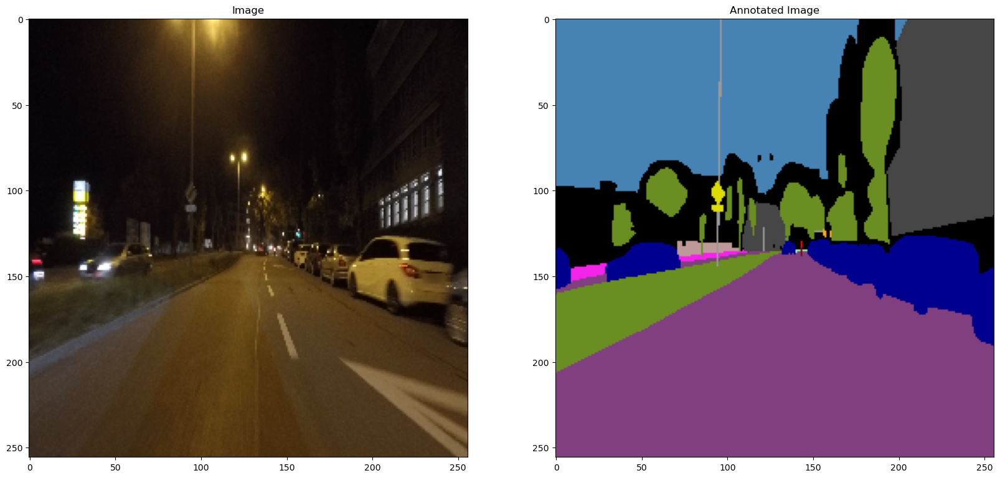

In [4]:
random_duo = training_duo[0]
image = img_to_array(load_img(random_duo[0], target_size=image_size))
annotated_image = img_to_array(load_img(random_duo[1], target_size =image_size))
fig, (ax1, ax2) = plt.subplots(1, 2)
fig.set_figheight(20)
fig.set_figwidth(20)
ax1.set_title('Image')
ax1.imshow(image / 255.)
ax2.set_title('Annotated Image')
ax2.imshow(annotated_image / 255.)

In [5]:
image_size = (256, 256)
classes_df = pd.read_csv(data['CLASS_PATH'])
classes = []
for index, item in classes_df.iterrows():
    classes.append(np.array([item['r'], item['g'], item['b']]))
num_classes = len(classes)

In [6]:
model = UNet(image_size, 3, 64, num_classes).model

In [7]:
model.summary()

Model: "UNet"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input (InputLayer)             [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv2d (Conv2D)                (None, 256, 256, 64  1792        ['input[0][0]']                  
                                )                                                                 
                                                                                                  
 batch_normalization (BatchNorm  (None, 256, 256, 64  256        ['conv2d[0][0]']                 
 alization)                     )                                                              

                                                                                                  
 batch_normalization_10 (BatchN  (None, 32, 32, 512)  2048       ['conv2d_10[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 conv2d_11 (Conv2D)             (None, 32, 32, 512)  2359808     ['batch_normalization_10[0][0]'] 
                                                                                                  
 batch_normalization_11 (BatchN  (None, 32, 32, 512)  2048       ['conv2d_11[0][0]']              
 ormalization)                                                                                    
                                                                                                  
 dropout_2 (Dropout)            (None, 32, 32, 512)  0           ['batch_normalization_11[0][0]'] 
          

In [8]:
model.compile(optimizer='adam', loss='categorical_crossentropy' ,metrics=['accuracy', keras.metrics.OneHotMeanIoU(num_classes=num_classes)])
# To load previously trained model
# model.load_weights('./night-weights.h5')

In [9]:
from tensorflow.keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau, CSVLogger, TensorBoard

my_callbacks = [
    CSVLogger("./models/UNet/logs/log.csv", separator=",", append=False),
    ModelCheckpoint(filepath='./models/UNet/night-weights.h5', save_weights_only=True, monitor='val_accuracy', mode='max', save_best_only=True),
    TensorBoard(log_dir='./models/UNet/logs')
]

In [10]:
training_data = DataGenerator(training_duo+testing_duo,classes,num_classes,batch_size=3, dim=image_size ,shuffle=True)
training_steps = training_data.__len__()

In [11]:
validation_data = DataGenerator(validation_duo,classes,num_classes,batch_size=3, dim=image_size ,shuffle=True)
validation_steps = validation_data.__len__()

In [12]:
model_train = model.fit(training_data, epochs=100, callbacks=my_callbacks, validation_data=validation_data, steps_per_epoch=training_steps, validation_steps=validation_steps)

Epoch 1/100
133/133 [==============================] - 117s 689ms/step - loss: 1.5767 - accuracy: 0.5093 - one_hot_mean_io_u: 0.0877 - val_loss: 78.3330 - val_accuracy: 0.2003 - val_one_hot_mean_io_u: 0.0232
Epoch 2/100
133/133 [==============================] - 36s 269ms/step - loss: 1.2104 - accuracy: 0.5890 - one_hot_mean_io_u: 0.1177 - val_loss: 9.1559 - val_accuracy: 0.3092 - val_one_hot_mean_io_u: 0.0374
Epoch 3/100
133/133 [==============================] - 35s 264ms/step - loss: 1.1168 - accuracy: 0.6130 - one_hot_mean_io_u: 0.1324 - val_loss: 3.4631 - val_accuracy: 0.3520 - val_one_hot_mean_io_u: 0.0610
Epoch 4/100
133/133 [==============================] - 35s 265ms/step - loss: 1.0697 - accuracy: 0.6253 - one_hot_mean_io_u: 0.1412 - val_loss: 1.9675 - val_accuracy: 0.5267 - val_one_hot_mean_io_u: 0.1118
Epoch 5/100
133/133 [==============================] - 35s 264ms/step - loss: 1.0233 - accuracy: 0.6412 - one_hot_mean_io_u: 0.1517 - val_loss: 1.2766 - val_accuracy: 0.6086 

Epoch 41/100
133/133 [==============================] - 35s 262ms/step - loss: 0.4424 - accuracy: 0.8399 - one_hot_mean_io_u: 0.3877 - val_loss: 0.8548 - val_accuracy: 0.7193 - val_one_hot_mean_io_u: 0.2675
Epoch 42/100
133/133 [==============================] - 35s 262ms/step - loss: 0.4420 - accuracy: 0.8411 - one_hot_mean_io_u: 0.3796 - val_loss: 1.0243 - val_accuracy: 0.7141 - val_one_hot_mean_io_u: 0.2437
Epoch 43/100
133/133 [==============================] - 35s 262ms/step - loss: 0.4381 - accuracy: 0.8425 - one_hot_mean_io_u: 0.3787 - val_loss: 0.9215 - val_accuracy: 0.7142 - val_one_hot_mean_io_u: 0.2570
Epoch 44/100
133/133 [==============================] - 35s 262ms/step - loss: 0.4181 - accuracy: 0.8495 - one_hot_mean_io_u: 0.3975 - val_loss: 0.9145 - val_accuracy: 0.7104 - val_one_hot_mean_io_u: 0.2624
Epoch 45/100
133/133 [==============================] - 35s 262ms/step - loss: 0.3972 - accuracy: 0.8573 - one_hot_mean_io_u: 0.4119 - val_loss: 0.9941 - val_accuracy: 0.71

133/133 [==============================] - 35s 263ms/step - loss: 0.1952 - accuracy: 0.9297 - one_hot_mean_io_u: 0.6718 - val_loss: 1.0663 - val_accuracy: 0.7221 - val_one_hot_mean_io_u: 0.2970
Epoch 81/100
133/133 [==============================] - 35s 261ms/step - loss: 0.1888 - accuracy: 0.9317 - one_hot_mean_io_u: 0.6825 - val_loss: 1.1115 - val_accuracy: 0.7295 - val_one_hot_mean_io_u: 0.2981
Epoch 82/100
133/133 [==============================] - 35s 262ms/step - loss: 0.1825 - accuracy: 0.9339 - one_hot_mean_io_u: 0.6966 - val_loss: 1.1287 - val_accuracy: 0.7184 - val_one_hot_mean_io_u: 0.2989
Epoch 83/100
133/133 [==============================] - 35s 262ms/step - loss: 0.1802 - accuracy: 0.9348 - one_hot_mean_io_u: 0.6922 - val_loss: 1.1204 - val_accuracy: 0.7219 - val_one_hot_mean_io_u: 0.3074
Epoch 84/100
133/133 [==============================] - 35s 261ms/step - loss: 0.1769 - accuracy: 0.9356 - one_hot_mean_io_u: 0.7051 - val_loss: 1.1394 - val_accuracy: 0.7254 - val_one_

In [13]:
prediction = Predict(image_size, model, classes)

1/1 [==============================] - 0s 18ms/step


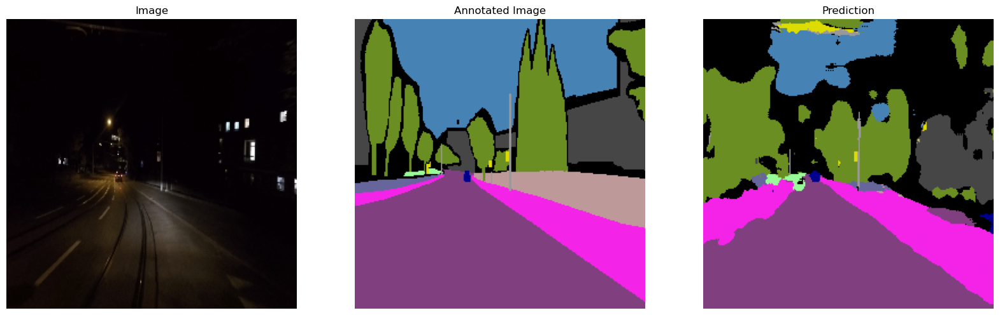

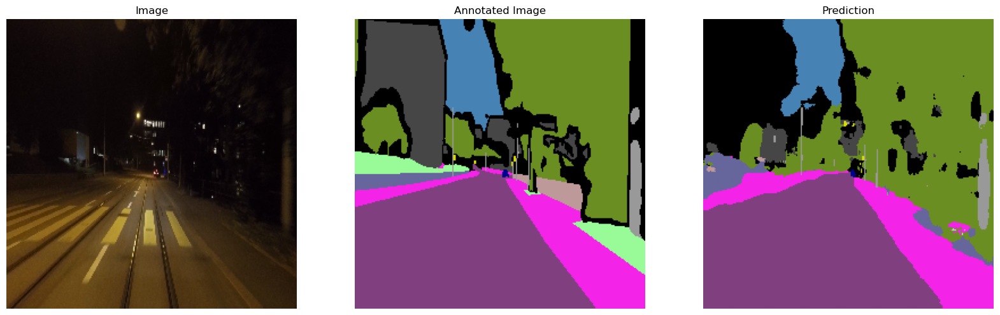

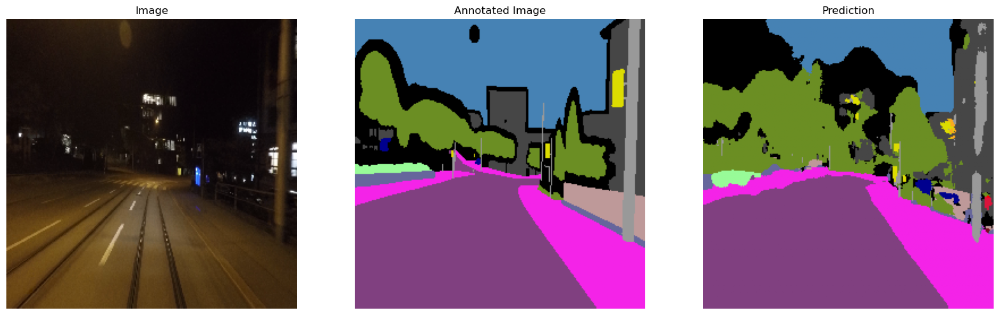

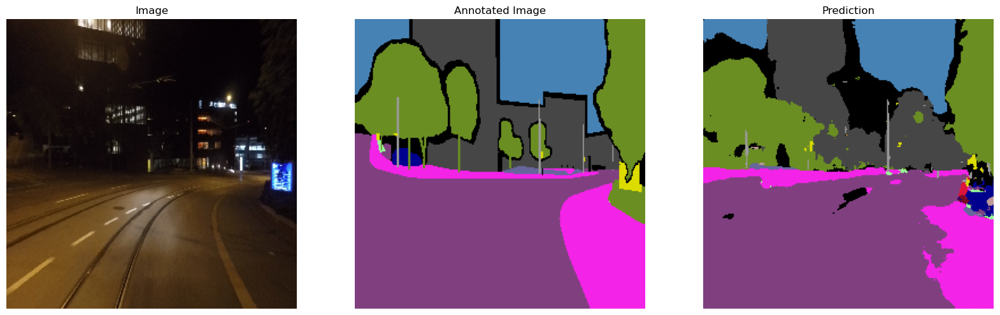

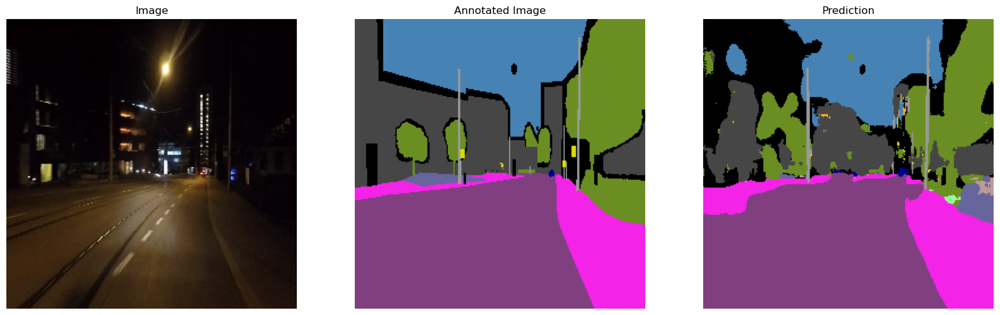

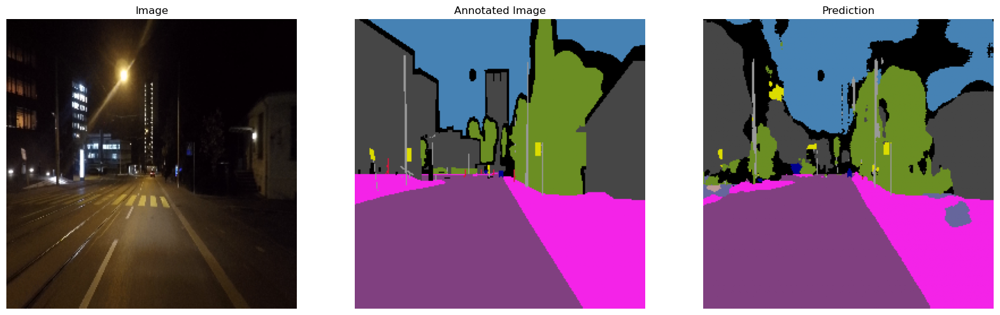

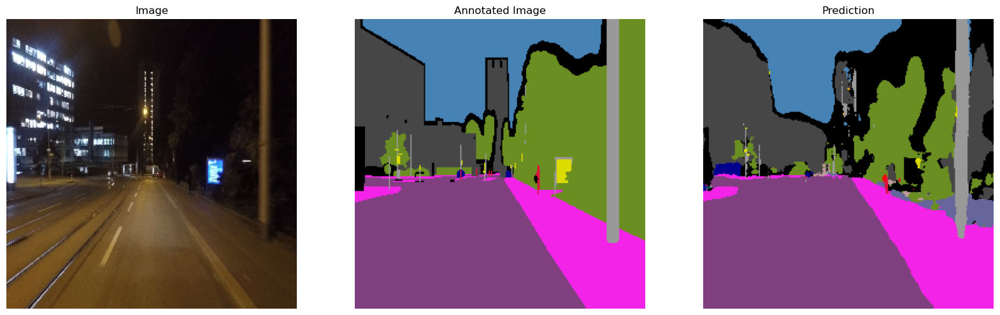

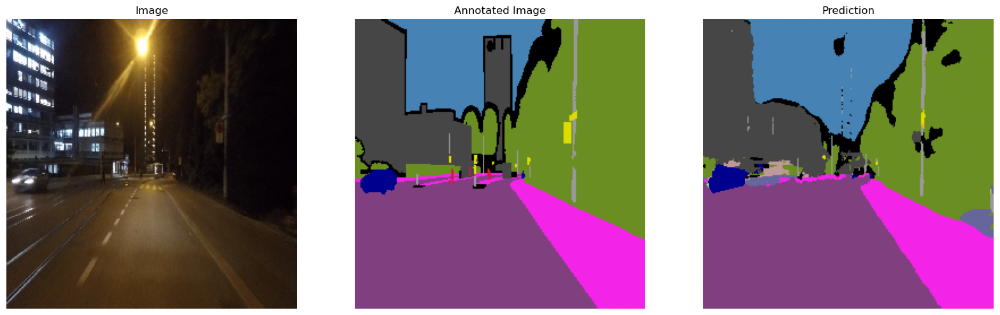

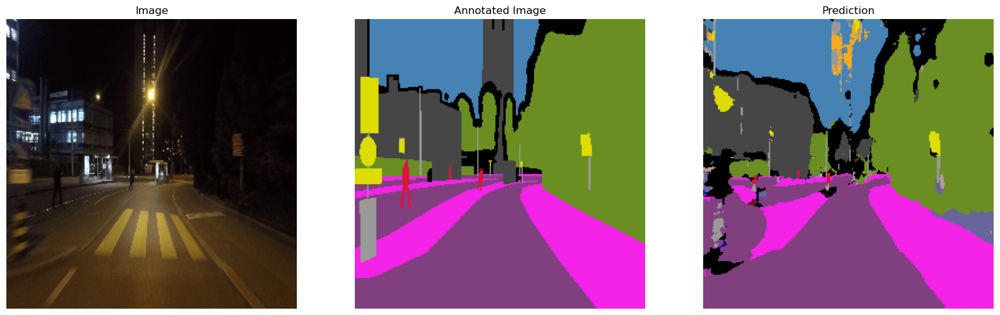

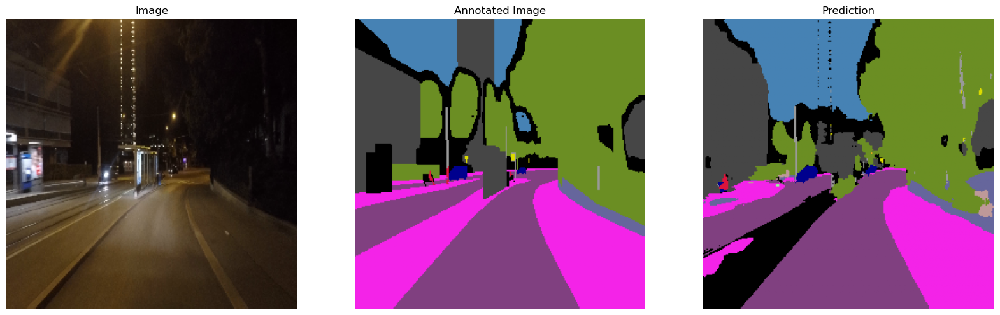

In [14]:
for x in range(0, 10):
    prediction.predict(validation_duo[x])

1/1 [==============================] - 0s 16ms/step


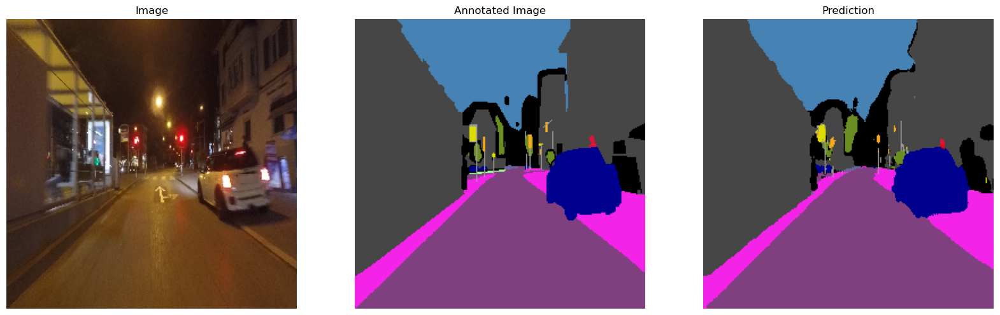

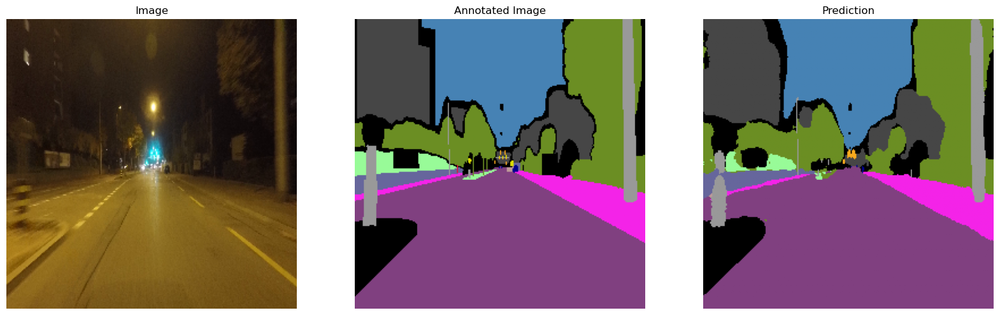

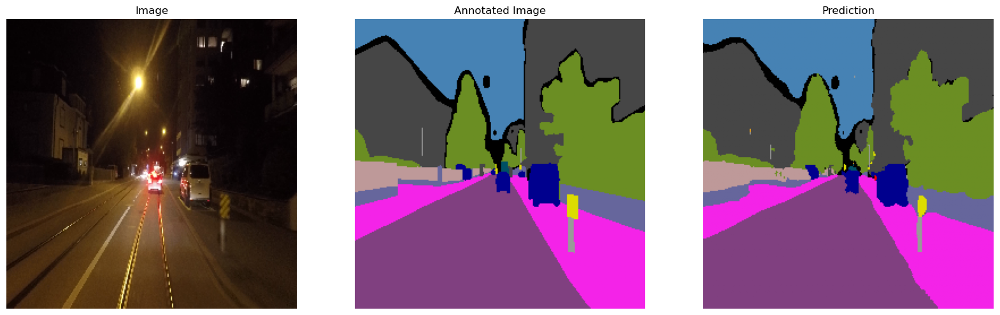

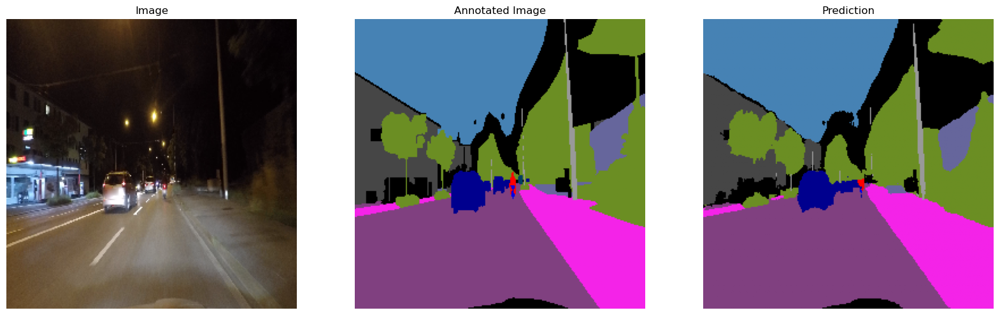

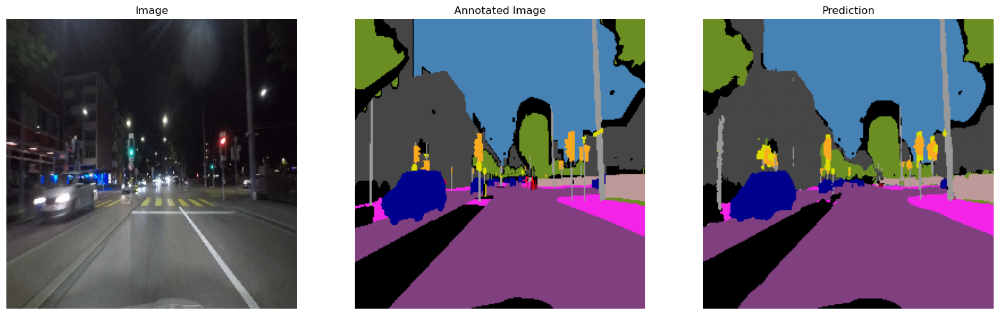

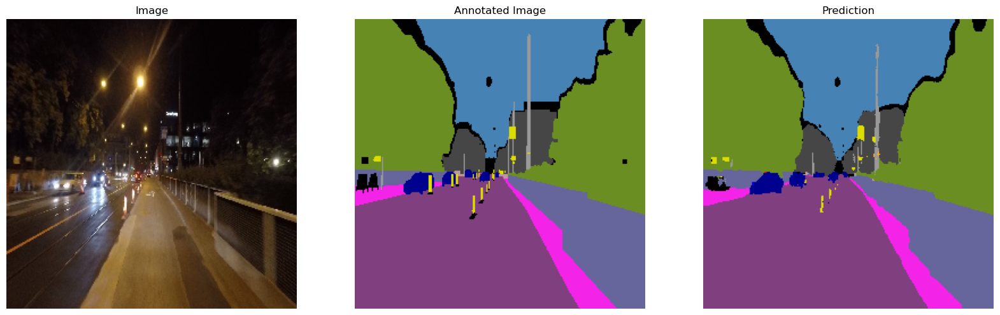

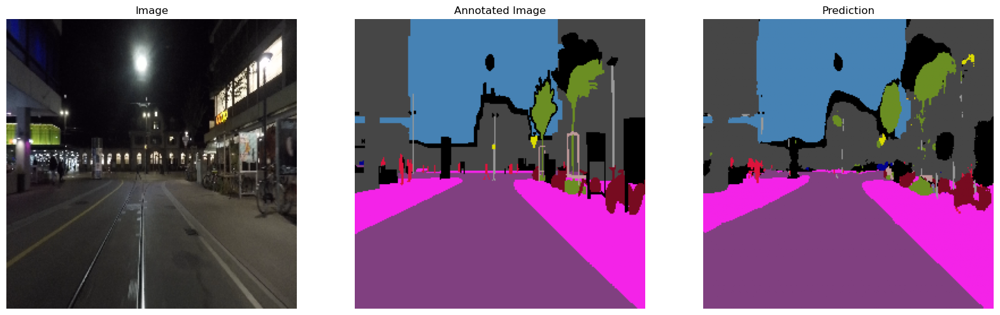

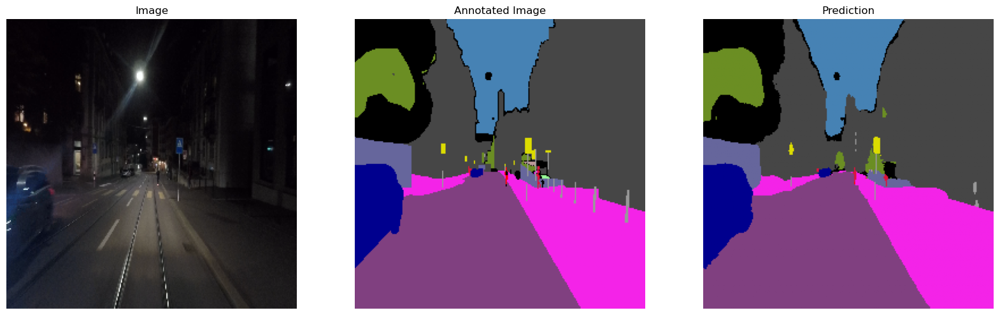

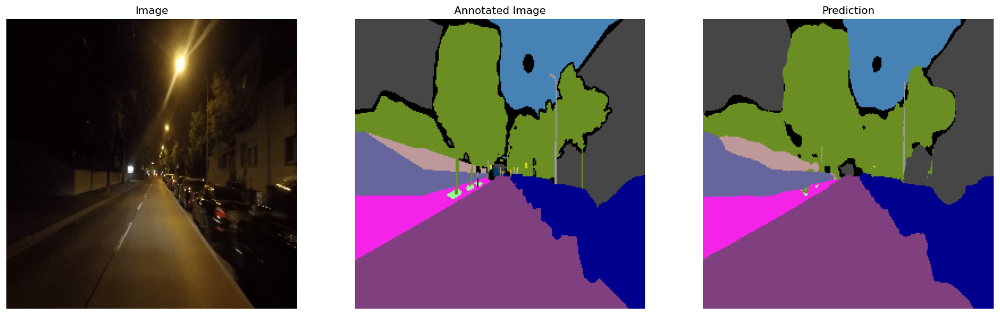

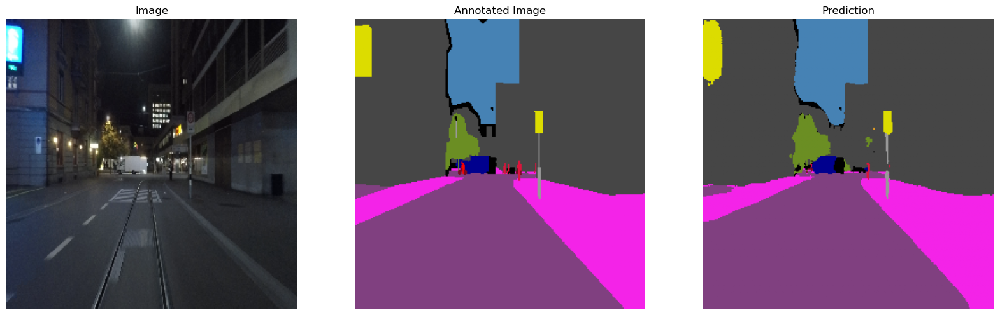

In [15]:
for x in range(0, 10):
    prediction.predict(testing_duo[x])

1/1 [==============================] - 0s 17ms/step


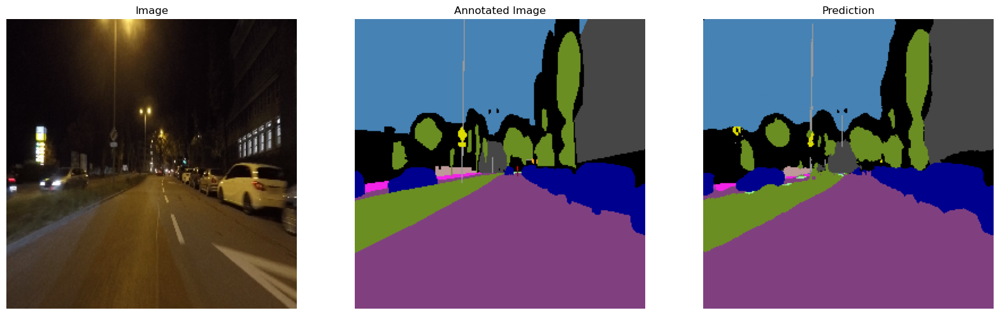

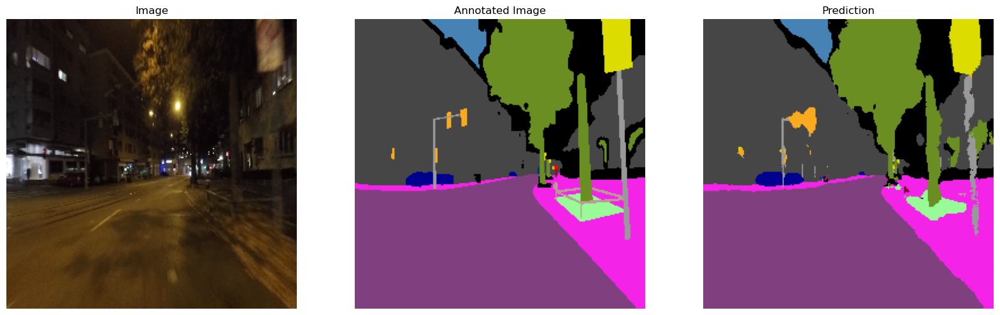

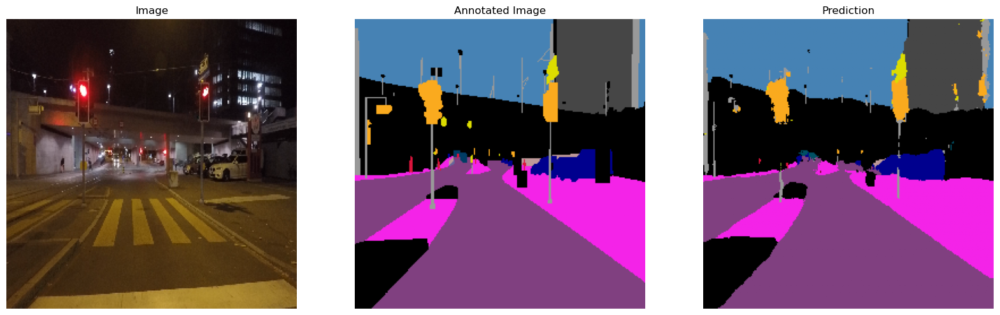

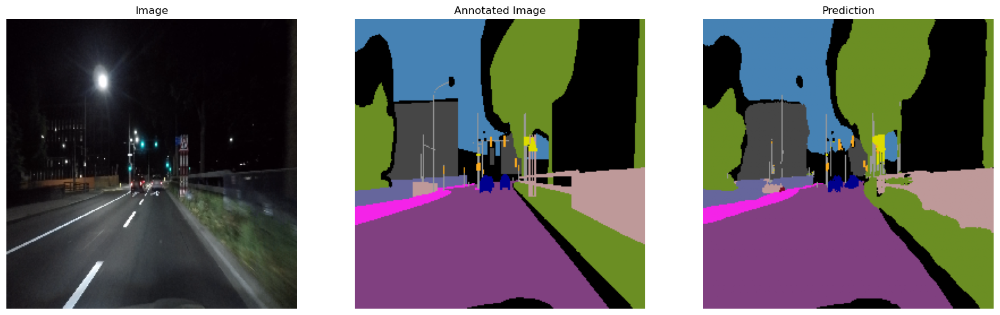

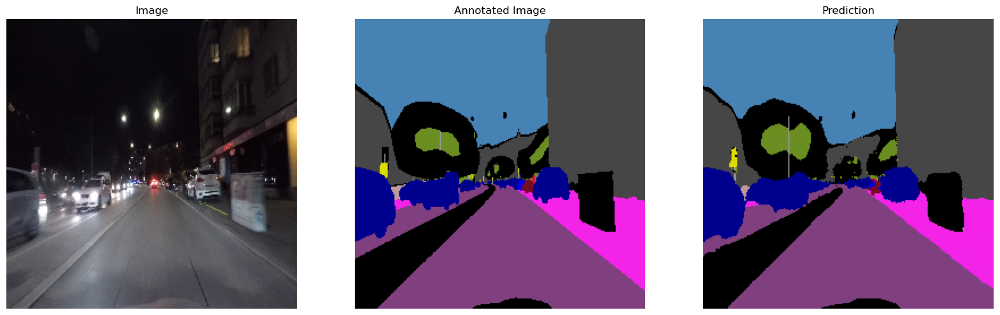

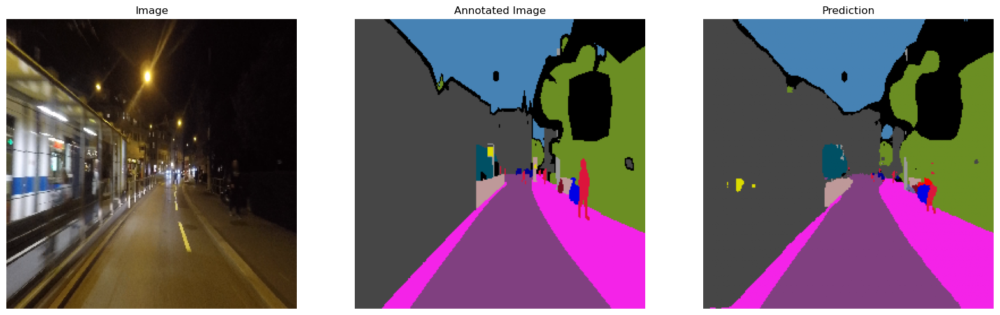

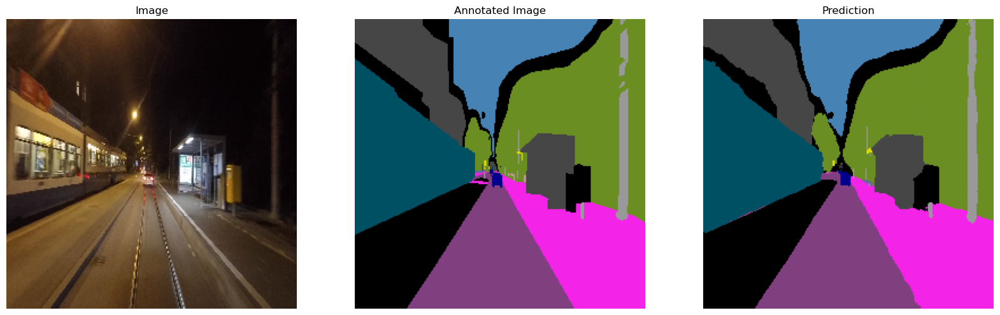

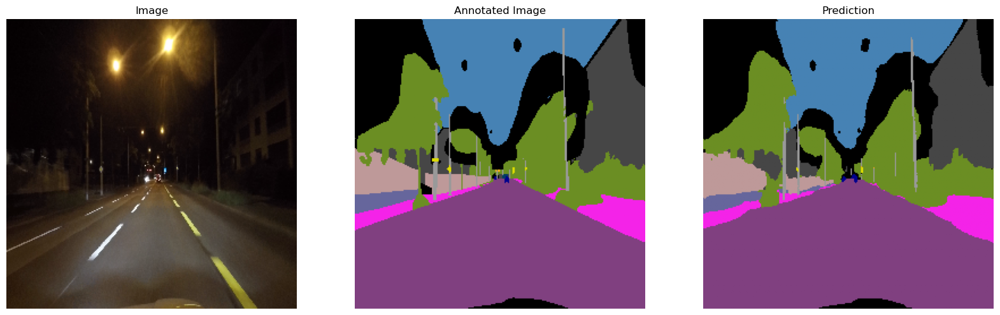

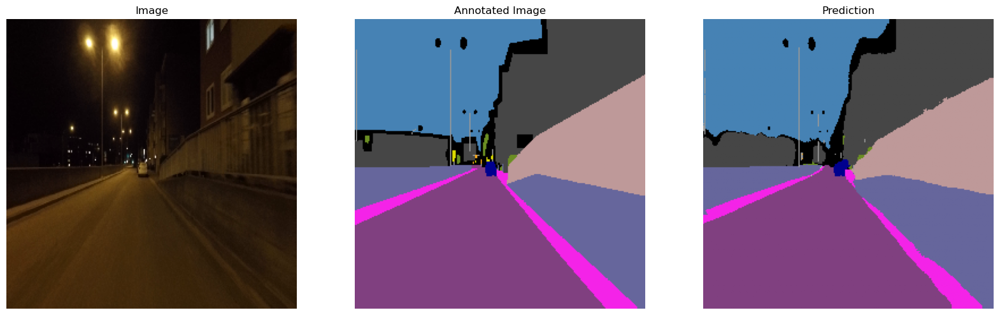

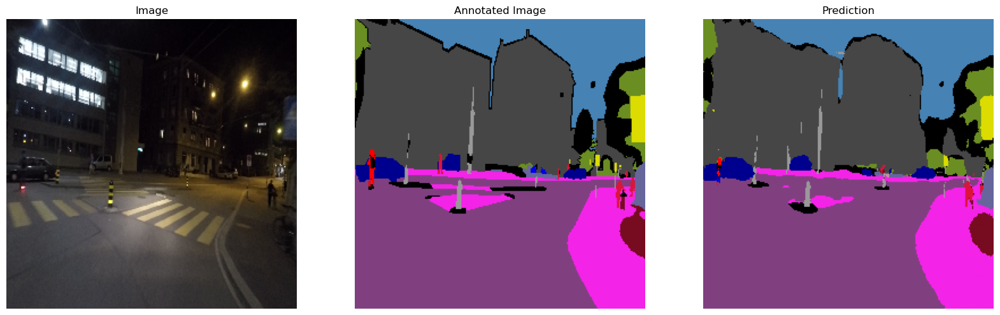

In [16]:
for x in range(0, 10):
    prediction.predict(training_duo[x])